# Importation des packages 

In [0]:
#t =pd.DataFrame()
#t=train.copy() " pour copy the columns" or t=train['isFraud'].copy()
# accée pour une cellule i d'une collonne est train['isFraud].iloc[i] pour series et array , pour data frame train['isFraud'][i]
#train_enco['P_emaildomain'][train_enco['P_emaildomain']=='NaN']=np.nan # il faut bien éclaircir au compélateur les NAN se sont des np.nan non des strings

import matplotlib.pyplot as plt
%matplotlib inline
## à compléter
import pandas as pd
import numpy as np
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats

import sklearn
from scipy.stats import mode # pour récupérer la médiane d'un varaible
from sklearn.preprocessing import MinMaxScaler, StandardScaler,MaxAbsScaler,RobustScaler# pour pouvoir faire scaling sur notre jeu des données 
from sklearn.model_selection import train_test_split # construction de la base de test et d'apprentissage
import pickle as pkl
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix,roc_curve,roc_auc_score
from sklearn.svm import SVR # séparation vaste Réfression : Support Vector Marge pour la régression
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dropout # régularization hyper-paramétre
from keras.layers import Dense, Activation, Flatten
from sklearn.model_selection import train_test_split
from keras.optimizers import SGD # régularization hyper-paramétre ==> surveilleance de learning rate
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from statistics import mean
import seaborn as sb


In [83]:

## changement de répertoire current de travail
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [84]:
# déclaration du chemin de mon répertoire
mypath ="drive/My Drive/la base des données_fraud_detection/" # chemin
!ls  "drive/My Drive/la base des données_fraud_detection/" # affichage des fichiers existants dans le répertoire

sample_submission.csv  test_transaction.csv  train_transaction.csv
test_identity.csv      train_identity.csv


In [0]:
# imporation des jeux des données 
test_identity = pd.read_csv(mypath+"test_identity.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0
test_transaction = pd.read_csv(mypath+"test_transaction.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0
train_transaction = pd.read_csv(mypath+"train_transaction.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # transactions + varaibales cibles
train_identity = pd.read_csv(mypath+"train_identity.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # caractéristique de chaque transaction
sample_submission = pd.read_csv(mypath+"sample_submission.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # resultats finals 
test_identity= test_identity[1:20000]
test_transaction=test_transaction[1:20000]
train_transaction=train_transaction[1:20000]
train_identity=train_identity[1:20000]

In [86]:
#Affichage des 5 premieres lignes de notre jeu de données
train_transaction.head(5)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2987005,0,86510,49.0,W,5937,555.0,150.0,visa,226.0,debit,272.0,87.0,36.0,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
#Affichage des 5 premieres lignes de notre jeu de données
test_transaction.head(5)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,NaN,231.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,280.000000,77.000000,0.000000,280.000000,0.000000,77.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,472.0,87.0,2635.0,NaN,hotmail.com,NaN,2.0,2.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.0,2.0,0.0,22.0,2.0,137.0,137.0,10.0,97.0,10.0,NaN,NaN,NaN,NaN,136.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,1321.000000,0.000000,0.000000,1058.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,263.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,205.0,87.0,17.0,NaN,gmail.com,NaN,5.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,7.0,4.0,42.0,42.0,41.0,242.0,41.0,NaN,NaN,NaN,NaN,242.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,282.540009,282.540009,282.540009,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,264.0,87.0,6.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,2.0,5.0,0.0,0.0,5.0,0.0,6.0,0.0,14.0,6.0,22.0,22.0,0.0,22.0,0.0,NaN,NaN,NaN,NaN,22.0,...,0.0,0.0,0.0,0.0,0.0,1.0,67.949997,183.850006,67.949997,67.949997,183.850006,67.949997,67.949997,67.949997,183.850006,67.949997,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,3663554,18403323,57.95,W,12839,321.0,150.0,visa,226.0,debit,512.0,87.0,NaN,NaN,gmail.com,NaN,5.0,5.0,0.0,0.0,2.0,3.0,0.0,0.0,2.0,0.0,4.0,0.0,10.0,4.0,36.0,36.0,35.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.949997,107.949997,107.949997,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
#dimensions : nombre de lignes, nombre de colonnes
#la ligne d'en-tête n'est pas comptabilisée dans le nombre de lignes
# train et test ne signifient pas les bases de test et de train : test signifie des transactions cible pour prédire la variable y=isFraude
# donc ultérierement on aura besoin de split notre base train en deux :train_train et train_test, aprés avoir séparer les varaibles endogénes et exogénes. on aura aussi plus tard de concaténer entre identity et transaction, puis faire extraire la varaible cible et varaibles explicatives
print("la taille de train_transaction est : Nombre de lignes",train_transaction.shape[0]," et Nombre de colonnes",train_transaction.shape[1])
print("la taille de test_transaction est : Nombre de lignes",test_transaction.shape[0]," et Nombre de colonnes",test_transaction.shape[1])
print("la taille de train_identity est : Nombre de lignes",train_identity.shape[0]," et Nombre de colonnes :(varaibale cible non compris: à prédire)",train_identity.shape[1])
print("la taille de test_identity est : Nombre de lignes",test_identity.shape[0]," et Nombre de colonnes",test_identity.shape[1])
# il y a une différence au niveau de taille entre train_transaction et train identity: ca revient de dire que il ya des personnes qui font du fraude plusieures fois au bien on a des doublants
print("la taille de submission est",sample_submission.shape[0],"\n et Nombre de colonnes",sample_submission.shape[1])


la taille de train_transaction est : Nombre de lignes 19999  et Nombre de colonnes 394
la taille de test_transaction est : Nombre de lignes 19999  et Nombre de colonnes 393
la taille de train_identity est : Nombre de lignes 19999  et Nombre de colonnes :(varaibale cible non compris: à prédire) 41
la taille de test_identity est : Nombre de lignes 19999  et Nombre de colonnes 41
la taille de submission est 506691 
 et Nombre de colonnes 2


In [89]:
# types des varaibles 
print("le type des varaibles de  transaction est : \n",train_transaction.dtypes)
print("\nle type des varaibles d'identity est :\n ",train_identity.dtypes)

le type des varaibles de  transaction est : 
 TransactionID       int64
isFraud             int64
TransactionDT       int64
TransactionAmt    float64
ProductCD          object
                   ...   
V335              float64
V336              float64
V337              float64
V338              float64
V339              float64
Length: 394, dtype: object

le type des varaibles d'identity est :
  TransactionID      int64
id_01            float64
id_02            float64
id_03            float64
id_04            float64
id_05            float64
id_06            float64
id_07            float64
id_08            float64
id_09            float64
id_10            float64
id_11            float64
id_12             object
id_13            float64
id_14            float64
id_15             object
id_16             object
id_17            float64
id_18            float64
id_19            float64
id_20            float64
id_21            float64
id_22            float64
id_23             object

In [90]:
#description des données : pour avoir des idées sur la structure et détecter les failles de notre jeu de données
pd.DataFrame(train_transaction.describe(include='all'))

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,1.999900e+04,19999.000000,19999.000000,19999.000000,19999,19999.00000,19756.000000,19998.000000,19996,19926.000000,19998,18323.000000,18323.000000,6831.000000,954.000000,15819,3497,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,10556.000000,11133.000000,8873.000000,6319.000000,1206.000000,572.000000,2608.000000,2608.000000,...,19999.000000,19999.000000,19999.000000,19999.000000,19999.00000,19999.0000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000,3371.000000
unique,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN,4,NaN,3,NaN,NaN,NaN,NaN,57,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,W,NaN,NaN,NaN,visa,NaN,debit,NaN,NaN,NaN,NaN,gmail.com,gmail.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,14773,NaN,NaN,NaN,12727,NaN,14930,NaN,NaN,NaN,NaN,7159,1373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.997000e+06,0.028101,301333.005350,129.684243,NaN,9815.20776,355.531484,152.620562,NaN,200.859932,NaN,292.331387,86.689843,122.099546,243.604822,NaN,NaN,8.359168,8.030752,0.014651,0.817791,5.636582,5.976599,0.178459,0.835192,4.273714,0.850693,6.087804,0.259613,28.897845,6.332617,94.007250,169.137457,26.926345,156.758030,34.778288,66.623549,51.337413,165.516567,0.558362,...,0.040002,0.043102,0.203960,0.224761,0.20996,1.0001,57.009602,245.724219,117.005019,11.078498,103.063059,4.259771,33.726796,17.927273,39.461697,22.626349,35.758054,120.028316,69.770202,10.102159,22.528764,13.415096,0.229902,0.582913,0.337585,0.027885,0.319786,0.116879,0.084841,0.127262,0.091071,32.947493,50.993177,38.070009,1.826164,14.546425,5.358647,11.843667,15.874221,12.413230
std,5.773358e+03,0.165267,129047.878821,218.854260,NaN,4832.41001,158.673998,10.222388,NaN,39.573502,NaN,103.022431,3.433657,363.667558,542.735209,NaN,NaN,34.358431,34.586898,0.178993,16.721141,24.663768,25.517325,1.474558,11.114702,14.978388,9.988112,25.947420,2.362406,95.406368,22.901140,145.667372,158.759942,54.277323,176.803798,67.393803,134.713407,103.640155,239.826822,0.322324,...,0.250811,0.262010,0.411788,0.501757,0.42777,0.0100,352.518162,1437.885467,718.874865,82.797950,298.907304,67.148594,128.839913,98.423186,170.673045,112.068870,307.891638,1264.382908,652.713046,98.508141,150.194518,113.477458,0.911650,2.504689,1.198890,0.180157,2.116858,0.757935,0.397968,0.709914,0.408021,206.241934,256.252096,212.726479,18.968834,107.153496,40.955891,76.103390,104.531092,78.130309
min,2.987001e+06,0.000000,86401.0

In [91]:
#description des données : pour avoir des idées sur la structure et détecter les failles de notre jeu de données
pd.DataFrame(train_identity.describe(include='all'))

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
count,1.999900e+04,19999.000000,19534.000000,9139.000000,9139.000000,18982.000000,18982.000000,757.000000,757.000000,10673.000000,10673.000000,19534.000000,19999,15634.000000,14527.000000,19534,18444,19358.000000,6014.000000,19354.00000,19348.000000,754.000000,758.000000,758,701.000000,748.000000,758.000000,758,19534,19534,14269,19508,14270.000000,13226,14235,19534,19534,19534,19534,19530,17552
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,65,76,NaN,95,4,2,2,2,2,2,638
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NotFound,NaN,NaN,Found,NotFound,NaN,NaN,NaN,NaN,NaN,NaN,IP_PROXY:TRANSPARENT,NaN,NaN,NaN,Found,Found,Found,Windows 10,chrome 62.0,NaN,1920x1080,match_status:2,T,F,T,T,desktop,Windows
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17518,NaN,NaN,9532,9305,NaN,NaN,NaN,NaN,NaN,NaN,427,NaN,NaN,NaN,757,11048,10673,4008,5444,NaN,3173,11135,14272,17939,15393,16070,13243,7518
mean,3.019894e+06,-8.087804,132269.395260,0.109640,-0.069264,1.961332,-5.909757,13.733157,-41.389696,0.147850,-0.379837,99.676517,NaN,47.593962,-344.742893,NaN,NaN,178.899783,14.002827,362.88762,386.896630,407.047745,15.646438,NaN,13.278174,325.691176,151.436675,NaN,NaN,NaN,NaN,NaN,26.406727,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,1.603023e+04,13.805693,120971.925195,0.699728,0.719545,5.288583,16.189087,11.076699,29.618340,1.096655,3.132717,1.248314,NaN,10.495406,85.177373,NaN,NaN,25.962914,1.514767,146.61813,154.747864,212.848456,6.252212,NaN,2.160938,113.251634,31.317323,NaN,NaN,NaN,NaN,NaN,3.695914,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,2.987008e+06,-100.000000,1120.000000,-11.000000,-13.000000,-31.000000,-100.000000,-16.000000,-100.000000,-23.000000,-100.000000,90.000000,NaN,11.000000,-600.000000,NaN,NaN,100.000000,11.000000,100.00000,100.000000,101.000000,14.000000,NaN,11.000000,102.000000,100.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,3.007368e+06,-5.000000,53235.250000,0.000000,0.000000,0.000000,-4.000000,5.000000,-51.000000,0.000000,0.000000,100.000000,NaN,49.000000,-360.000000,NaN,NaN,166.000000,13.000000,266.00000,222.000000,252.000000,14.000000,NaN,11.000000,246.500000,121.000000,NaN,NaN,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,3.021393e+06,-5.000000,97771.500000,0.000000,0.000000,0.000000,0.000000,14.000000,-34.000000,0.000000,0.000000,100.000000,NaN,52.000000,-300.000000,NaN,NaN,166.000000,15.000000,352.00000,391.000000,255.000000,14.000000,NaN,15.000000,321.000000,154.000000,NaN,NaN,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,3.033500e+06,-5.000000,169048.250000,0.000000,0.000000,1.000000,0.000000,22.000000,-21.000000,0.000000,0.000000,100.000000,NaN,52.000000,-300.000000,NaN,NaN,166.000000,15.000000,492.00000,533.000000,596.000000,14.000000,NaN,15.000000,426.000000,179.000000,NaN,NaN,NaN,NaN,NaN,32.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## traitement des valeurs manquantes et doublantes

In [92]:
# concaténation des bases des données 
test = test_transaction.merge(test_identity, how='left', left_index=True, right_index=True) # ID de transaction y compris
train = train_transaction.merge(train_identity, how='left', left_index=True, right_index=True) # ID de transaction y compris, Y exclue
print("taille de la base test", test.shape)
print("taille de la base train", train.shape)
train.drop(['TransactionID_x'],axis=1)
test.drop(['TransactionID_x'],axis=1)


taille de la base test (19999, 434)
taille de la base train (19999, 435)


,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,...,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
1,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,NaN,231.0,634.0,...,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,Found,NaN,-300.0,Found,Found,166.0,NaN,542.0,368.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Android 6.0.1,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,472.0,87.0,2635.0,NaN,hotmail.com,NaN,2.0,2.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.0,2.0,0.0,22.0,2.0,137.0,137.0,10.0,97.0,10.0,NaN,NaN,NaN,NaN,136.0,136.0,...,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,-360.0,New,NotFound,225.0,NaN,271.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,205.0,87.0,17.0,NaN,gmail.com,NaN,5.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,7.0,4.0,42.0,42.0,41.0,242.0,41.0,NaN,NaN,NaN,NaN,242.0,242.0,...,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,27.0,NaN,Found,Found,225.0,15.0,427.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,264.0,87.0,6.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,2.0,5.0,0.0,0.0,5.0,0.0,6.0,0.0,14.0,6.0,22.0,22.0,0.0,22.0,0.0,NaN,NaN,NaN,NaN,22.0,22.0,...,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,NaN,New,NotFound,225.0,15.0,567.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW
5,18403323,57.95,W,12839,321.0,150.0,visa,226.0,debit,512.0,87.0,NaN,NaN,gmail.com,NaN,5.0,5.0,0.0,0.0,2.0,3.0,0.0,0.0,2.0,0.0,4.0,0.0,10.0,4.0,36.0,36.0,35.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,-5.0,36786.0,NaN,NaN,4.0,-2.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,-480.0,New,NotFound,166.0,15.0,352.0,177.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.4.0,mobile safari 11.0,32.0,2208x1242,match_status:2,T,F,F,T,mobile,iOS Device
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19076952,59.00,W,12695,490.0,150.0,visa,226.0,debit,325.0,87.0,NaN,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,561.0,561.0,357.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,0.0,3547.0,0.0,0.0,2.0,-5.0,NaN,NaN,0.0,0.0,100.0,Found,NaN,-300.0,Found,Found,166.0,17.0,352.0,277.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Linux,chrome 68.0,24.0,2560x1440,match_status:2,T,F,T,T,desktop,NaN
19996,19076953,125.00,R,11520,399.0,150.0,american express,118.0,credit,204.0,87.0,NaN,NaN,gmail.com,yahoo.com,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-20.0,305825.0,NaN,NaN,-9.0,-26.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,NaN,New,NotFound,225.0,15.0,266.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 68.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-J701M Build/NRD90M
19997,19077019,35.95,W,10313,258.0,150.0,visa,226.0,debit,469.0,87.0,11.0,NaN,gmail.com,NaN,4.0,4.0,0.0,0.0,1.0,3.0,0.0,0.0,2.0,0.0,3.0,0.0,18.0,4.0,83.0,83.0,7.0,84.0,7.0,NaN,NaN,NaN,NaN,84.0,100.0,.

In [0]:
 #rennomation des varaible id _ Med
test.rename(columns=lambda x: x.replace("-","_"), inplace=True)


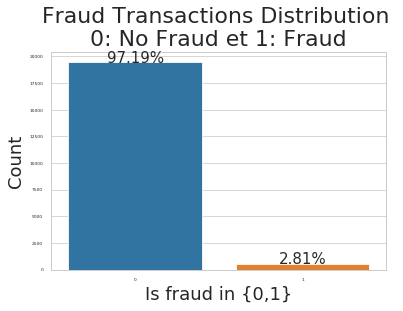

From total data  2.81 % contains fraud train
From total data  97.19 % contains legit train


In [94]:
# Data Visualisation==> Target
#######
####plot
import seaborn as sns
g=sns.countplot(train['isFraud'])
g.set_title("Fraud Transactions Distribution \n 0: No Fraud et 1: Fraud ", fontsize=22)
g.set_xlabel("Is fraud in {0,1}", fontsize=18)
g.set_ylabel('Count', fontsize=18)

#####pourcentage
total = len(train)
for p in g.patches: # g.patches : les battons de courbe 
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=15) 
########
plt.show()
print('From total data ',np.round(train[train['isFraud']==1].shape[0]/train.shape[0]*100,2),'% contains fraud train')
print('From total data ',np.round(train[train['isFraud']==0].shape[0]/train.shape[0]*100,2),'% contains legit train')
# en remarque que les deux pourcentage est non équilibrés donc il faut augmenter le poids de "1" ou bien utiliser des autres metrics de régression ( cas continue, convertir "isFraud" qui est binaire à varaible continue) ou bien  car accuracy dans ce cas n'est pas le bon metric qui reflete la bon prédiction 

##Mappinp et Réduction de la dimensionnalité 

Mapping email: 
puisque on a presque un nombre de modalité de varaible "email" est  clossal, donc on peut grouper les emails par entreprise, sinon le codage de la varaible "emails" explosera la dimension et la stricture des données ce qui provoquera au plus tards le probleme de sur-apprentissage.
Et aprés l'agrégtion, on extraira à chaque email deux variable le bin et suffix

P_emaildomain et R_emaildomain : 

In [0]:
#dictionnaire
emails = {'gmail': 'google', 'att.net': 'att', 'twc.com': 'spectrum', 
          'scranton.edu': 'other', 'optonline.net': 'other', 'hotmail.co.uk': 'microsoft',
          'comcast.net': 'other', 'yahoo.com.mx': 'yahoo', 'yahoo.fr': 'yahoo',
          'yahoo.es': 'yahoo', 'charter.net': 'spectrum', 'live.com': 'microsoft', 
          'aim.com': 'aol', 'hotmail.de': 'microsoft', 'centurylink.net': 'centurylink',
          'gmail.com': 'google', 'me.com': 'apple', 'earthlink.net': 'other', 'gmx.de': 'other',
          'web.de': 'other', 'cfl.rr.com': 'other', 'hotmail.com': 'microsoft', 
          'protonmail.com': 'other', 'hotmail.fr': 'microsoft', 'windstream.net': 'other', 
          'outlook.es': 'microsoft', 'yahoo.co.jp': 'yahoo', 'yahoo.de': 'yahoo',
          'servicios-ta.com': 'other', 'netzero.net': 'other', 'suddenlink.net': 'other',
          'roadrunner.com': 'other', 'sc.rr.com': 'other', 'live.fr': 'microsoft',
          'verizon.net': 'yahoo', 'msn.com': 'microsoft', 'q.com': 'centurylink', 
          'prodigy.net.mx': 'att', 'frontier.com': 'yahoo', 'anonymous.com': 'other', 
          'rocketmail.com': 'yahoo', 'sbcglobal.net': 'att', 'frontiernet.net': 'yahoo', 
          'ymail.com': 'yahoo', 'outlook.com': 'microsoft', 'mail.com': 'other', 
          'bellsouth.net': 'other', 'embarqmail.com': 'centurylink', 'cableone.net': 'other', 
          'hotmail.es': 'microsoft', 'mac.com': 'apple', 'yahoo.co.uk': 'yahoo', 'netzero.com': 'other', 
          'yahoo.com': 'yahoo', 'live.com.mx': 'microsoft', 'ptd.net': 'other', 'cox.net': 'other',
          'aol.com': 'aol', 'juno.com': 'other', 'icloud.com': 'apple'}

us_emails = ['gmail', 'net', 'edu']
def mapping_extr(base,bin=emails,suffix=us_emails):
   for c in ['P_emaildomain', 'R_emaildomain']:
       base[c + '_bin'] = base[c].map(emails)
    
       base[c + '_suffix'] = base[c].map(lambda x: str(x).split('.')[-1])
    
       base[c + '_suffix'] = base[c + '_suffix'].map(lambda x: x if str(x) not in us_emails else 'us')

       del base[c]
# aggrégation : se fait dans le cas ou on a l'eefectifs pour la modalité i de variable X et j de varaible Y sont inférieur à 5.( hypothese de test de indépendance de khi deux)
# et aussi éviter la production ou augmentation de dimension des donnée sau niveau de codage des varaibles qualitatives

In [0]:

mapping_extr(train)
mapping_extr(test)

#on aura deux varaibles de plus mais en fait, avec des modalités regroupées

## DeviceInfo

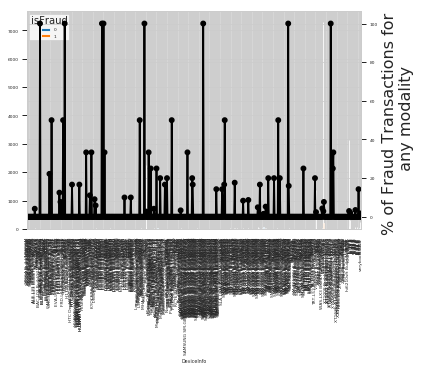

In [97]:
#analyse de la variable DeviceInfo

i="DeviceInfo"
y=train[i].copy()
x= train.isFraud.copy()
#y=train[i].copy() 
y=pd.DataFrame(y)
x=pd.DataFrame(x)
y['isFraud']=x.astype('category') # des pairs afin de faire le croisement 
t=pd.crosstab(y[y.columns[0]],y['isFraud']).plot.bar()
######
if (train[i].dtypes!='object' or train[i].dtypes=='object') :
  gt = t.twinx()
  tmp = pd.crosstab(y[i], y['isFraud'], normalize='index') * 100
  tmp = tmp.reset_index()
  tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True) 
  gt = sns.pointplot(x=str(i), y='Fraud', data=tmp, color='black', legend=False)
  gt.set_ylabel("% of Fraud Transactions for \n any modality", fontsize=16) # pour comparer les pourcentages de frauds parmi les non frauds de chaque modalité, par rapport ceux des autres modalités : pour prendre en compte le poids de chaque modalité

# aggrégation : se fait dans le cas ou on a l'eefectifs pour la modalité i de variable X et j de varaible Y sont inférieur à 5.( hypothese de test de indépendance de khi deux)
# et aussi éviter la production ou augmentation de dimension des donnée sau niveau de codage des varaibles qualitatives

In [0]:
# les modalité de varaible DeviseInfo  # train['DeviceInfo'].value_counts()

def aggr(x,y,var):
  lis=list((x[var]))
  lis.extend(y[var])
  value=x[var].copy().value_counts().add(y[var].copy().value_counts(), fill_value=0)#addittion de deux series
  z=[i for i in list(set(lis))[1:] if  (value[i].astype('float') <= 0.2*value.max() ) == True ] # les modalités que on doit changer
  for i in np.arange(0,len(x)): 
     if  x[var].iloc[i] in z  :
      x[var].iloc[i]=np.nan# " nan" à imputer dans étapes d'imputation des vlaeurs manquantes
     elif  x[var].iloc[i] not in  list(set(list((y[var]))))[1:]: 
        x[var].iloc[i]=np.nan

     if y[var].iloc[i] in z :
      y[var].iloc[i]=np.nan# " nan" à imputer dans étapes d'imputation des vlaeurs manquantes
     elif  y[var].iloc[i] not in  list(set(list((x[var]))))[1:]: 
        y[var].iloc[i]=np.nan
    
#

In [99]:
#apply pour 'DeviceInfo' 'id_30' 'id_31' 'id_33'

aggr(train,test,'DeviceInfo')
aggr(train,test,'id_30') 
aggr(train,test,'id_31')
aggr(train,test,'id_33')


/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


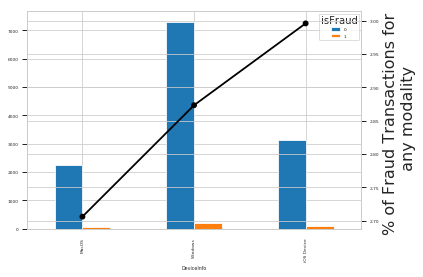

In [100]:
#analyse de la variable DeviceInfo

i="DeviceInfo"
y=train[i].copy()
x= train.isFraud.copy()
#y=train[i].copy() 
y=pd.DataFrame(y)
x=pd.DataFrame(x)
y['isFraud']=x.astype('category') # des pairs afin de faire le croisement 
t=pd.crosstab(y[y.columns[0]],y['isFraud']).plot.bar()
######
if (train[i].dtypes!='object' or train[i].dtypes=='object') :
  gt = t.twinx()
  tmp = pd.crosstab(y[i], y['isFraud'], normalize='index') * 100
  tmp = tmp.reset_index()
  tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True) 
  gt = sns.pointplot(x=str(i), y='Fraud', data=tmp, color='black', legend=False)
  gt.set_ylabel("% of Fraud Transactions for \n any modality", fontsize=16) 
# pour labscice z désigne la porpabilité que un client  fasse un fraud sachant que la modalité pour un varibel donnée e

# préparation des données

In [0]:
del train['TransactionID_x']
del test['TransactionID_x']
del train['TransactionID_y']
del test['TransactionID_y']

In [0]:
# réduction de mémoire  # etape avant PCA
from tqdm import tqdm
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in tqdm(df.columns):
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: 
        print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [103]:
# mémoire réduite  # ETAPE AVANT PCA  # à  supprimer dans le cas d'apparition l'erreur  de genre :  ValueError: Shape of passed values is blah, indices imply blah2
#train=reduce_mem_usage(train)
#test=reduce_mem_usage(test)
print('training set shape:', train.shape)
print('test set shape:', test.shape)

training set shape: (19999, 435)
test set shape: (19999, 434)


In [104]:
# suprission des valeurs des clients qui ont NAN comme valeur de varaiable cible 
## traitements des valeurs manquantes standards et non standards
# Nombre total de valeurs manquantes pour chaque caractéristique
#print(Clean_data.isnull().sum())
########################################## valeurs manquentes par colonne : par varaible
print("\n nombre totale de valeurs manquentes pour ISFraude ",train['isFraud'].isnull().sum() ) # filtrage
# nombre de valeurs manquantes pour la variable cible


 nombre totale de valeurs manquentes pour ISFraude  0


In [105]:
# supprision des doublants : ligne  ###########################################base train

dupli_train=train.duplicated() # récupération de vecteur des valeurs de la fonction duplicate
# on affiche les lignes doublontes par 
print(train[train.duplicated()])
print(" le nombre des valeurs doublons  est : ", train[train.duplicated()].shape)
# Révérification 
############### méthode 1
print(" le nombre des valeurs doublontes aprés le traitement  est : ", len(dupli_train[dupli_train.values==True]))
train =train.drop_duplicates()


Empty DataFrame
Columns: [isFraud, TransactionDT, TransactionAmt, ProductCD, card1, card2, card3, card4, card5, card6, addr1, addr2, dist1, dist2, C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, D1, D2, D3, D4, D5, D6, D7, D8, D9, D10, D11, D12, D13, D14, D15, M1, M2, M3, M4, M5, M6, M7, M8, M9, V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V25, V26, V27, V28, V29, V30, V31, V32, V33, V34, V35, V36, V37, V38, V39, V40, V41, V42, V43, V44, V45, V46, V47, V48, ...]
Index: []

[0 rows x 435 columns]
 le nombre des valeurs doublons  est :  (0, 435)
 le nombre des valeurs doublontes aprés le traitement  est :  0


In [106]:
# supprision des doublants de ligne {####################################################"" base test}
dupli_test=test.duplicated() # récupération de vecteur des valeurs de la fonction duplicate
# on affiche les lignes doublonts par 
print(test[test.duplicated()])
print(" le nombre des valeurs doublons  est : ", test[test.duplicated()].shape)
# Révérification 
############### méthode 1
print(" le nombre des valeurs doublontes aprés le traitement  est : ", len(dupli_test[dupli_test.values==True]))

test=test.drop_duplicates()
# supprision des doublants : colonne{####################################################"" base test}


Empty DataFrame
Columns: [TransactionDT, TransactionAmt, ProductCD, card1, card2, card3, card4, card5, card6, addr1, addr2, dist1, dist2, C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, D1, D2, D3, D4, D5, D6, D7, D8, D9, D10, D11, D12, D13, D14, D15, M1, M2, M3, M4, M5, M6, M7, M8, M9, V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V25, V26, V27, V28, V29, V30, V31, V32, V33, V34, V35, V36, V37, V38, V39, V40, V41, V42, V43, V44, V45, V46, V47, V48, V49, ...]
Index: []

[0 rows x 434 columns]
 le nombre des valeurs doublons  est :  (0, 434)
 le nombre des valeurs doublontes aprés le traitement  est :  0


In [107]:
# Valeur manquante  par colonnes 
[print(" nombre totale de valeurs manquentes pour Train ",i, "est :",train[i].isnull().sum() ) for i in train.columns if train[i].isnull().sum()!=0] # filtrage
[print(" nombre totale de valeurs manquentes pour Test ",i, "est :",test[i].isnull().sum() ) for i in test.columns if test[i].isnull().sum()!=0] # filtrage



 nombre totale de valeurs manquentes pour Train  card2 est : 243
 nombre totale de valeurs manquentes pour Train  card3 est : 1
 nombre totale de valeurs manquentes pour Train  card4 est : 3
 nombre totale de valeurs manquentes pour Train  card5 est : 73
 nombre totale de valeurs manquentes pour Train  card6 est : 1
 nombre totale de valeurs manquentes pour Train  addr1 est : 1676
 nombre totale de valeurs manquentes pour Train  addr2 est : 1676
 nombre totale de valeurs manquentes pour Train  dist1 est : 13168
 nombre totale de valeurs manquentes pour Train  dist2 est : 19045
 nombre totale de valeurs manquentes pour Train  D2 est : 9443
 nombre totale de valeurs manquentes pour Train  D3 est : 8866
 nombre totale de valeurs manquentes pour Train  D4 est : 11126
 nombre totale de valeurs manquentes pour Train  D5 est : 13680
 nombre totale de valeurs manquentes pour Train  D6 est : 18793
 nombre totale de valeurs manquentes pour Train  D7 est : 19427
 nombre totale de valeurs manquent

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [108]:
##########################################autre méthode manuelle : valeurs manquantes par ligne
def num_missing(x):
    return sum(x.isnull())
#########################################application pour chaque ligne:

print("\nValeurs manquantes Train  par ligne:")
print(train.apply(num_missing, axis=1))

print("\nValeurs manquantes Test par ligne:")
print(test.apply(num_missing, axis=1))


Valeurs manquantes Train  par ligne:
1        204
2        186
3        207
4        132
5        183
        ... 
19995     88
19996    190
19997    182
19998    209
19999    132
Length: 19999, dtype: int64

Valeurs manquantes Test par ligne:
1        187
2        188
3        189
4        190
5        186
        ... 
19995    187
19996    139
19997    185
19998    128
19999    180
Length: 19999, dtype: int64


In [0]:
#

In [110]:
(train.columns).shape[0]-(test.columns).shape[0]

1

In [0]:
# supprission des colonnes qui plus de 90% des missing values
def dro_p(base,base1,pourc):
  for i in base.columns :
    if base[i].isnull().sum() >= base.shape[0]*pourc:
      if i in base1.columns:
        base1.drop([i], axis='columns', inplace=True)
        base.drop([i], axis='columns', inplace=True)

dro_p(train,test,0.9) # appelle de la fonction qui supprimer les colonnes correspondants un nombre des valeurs manquantes supérieur que 1/3 de la taille de notre jeu de données
# on doit suuprimer la colonne de base test et de train , sinon il y'aura des problémes au niveau de la prédiction

In [112]:
(train.columns).shape[0]-(test.columns).shape[0]

1

In [113]:
   ##############"""""" taux des valeurs manquantes pour chaque varaible ######################""""
#Recognize missing data # pourcentage des données nulles pour chaque varaible
data_null_train = train.isnull().sum()/len(train) * 100
data_null_train = data_null_train.drop(data_null_train[data_null_train == 0].index).sort_values(ascending=False)[:500]
missing_data_train = pd.DataFrame({'Missing Ratio_train ': data_null_train})
missing_data_train.head()

,Missing Ratio_train
D8,86.959348
D9,86.959348
V165,83.209160
V166,83.209160
V153,83.209160


In [114]:
            ##############"""""" taux des valeurs manquantes pour chaque varaible : test ######################""""

##
data_null_test = test.isnull().sum()/len(test) * 100
data_null_test = data_null_test.drop(data_null_test[data_null_test == 0].index).sort_values(ascending=False)[:500]
missing_data_test = pd.DataFrame({'Missing Ratio_train ': data_null_test})
missing_data_test.head()

,Missing Ratio_train
V153,92.574629
V149,92.574629
V164,92.574629
V163,92.574629
V162,92.574629


Text(0, 0.5, 'Missing rate_train')

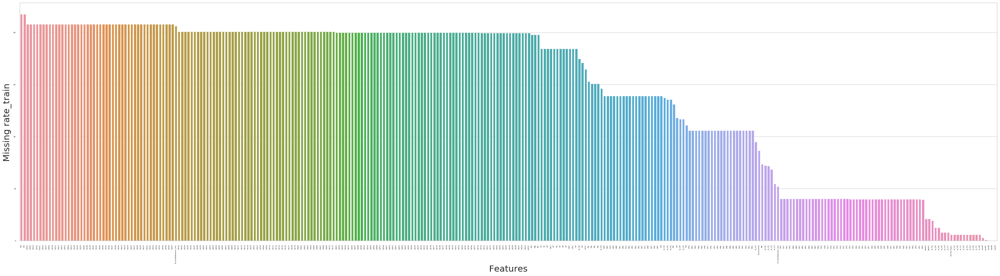

In [115]:
# plot missing rate : train 
import seaborn as sns

plt.subplots(figsize=(40,10))
plt.xticks(rotation='90')
sns.barplot(data_null_train.index, data_null_train)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Missing rate_train', fontsize=20)

Text(0, 0.5, 'Missing rate_test')

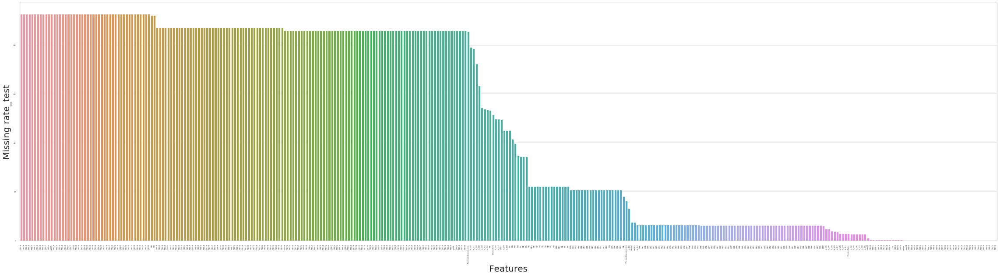

In [116]:
# plot missing rate : test 
import seaborn as sns

plt.subplots(figsize=(40,10))
plt.xticks(rotation='90')
sns.barplot(data_null_test.index, data_null_test)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Missing rate_test', fontsize=20)

In [117]:
# imputation des valeurs manquantes ##################################################################""""""""""
# Maintenant, nous pouvons remplir les valeurs manquantes en utilisant la technique 2: mode
# ########################################"il faut faire attention au varaible qualitative : inimputable par la moyenne

def Imput(base) :
  base1=pd.DataFrame()
  base1=base.copy()
  for i in base.columns:
    if base[i].dtypes!= object:
        t =pd.DataFrame()
        t=base1[i].copy() # pour calculer la moyenne np.nanmean retourne inf et np.mean n'est pas valble dans le cas ou il ya des nan , donc on a procédeé par écarter de nanpourque on puisse calcler mean
            #np.nanmean(t.dropna(inplace=True))
        t.dropna(inplace=True)
        base1[i].fillna(np.mean(np.array(t)),inplace=True)
    if base[i].dtypes=='object':
      base1[i].fillna(base1[i].mode().iloc[0],inplace=True)
  return base1

Train_mode_mean=Imput(train)
Test_mode_mean=Imput(test)

# re-teste les valeurs manquantes de nouveau pour valider par deux méthodes 
[print(" nombre totale de valeurs manquentes pour train ",i, "est :",Train_mode_mean[i].isnull().sum() ) for i in Train_mode_mean.columns if Train_mode_mean[i].isnull().sum()!=0] # filtrage
# il y a plus des valeurs manquantes dans notre jeu de données
[print(" nombre totale de valeurs manquentes pour test ",i, "est :",Test_mode_mean[i].isnull().sum() ) for i in Test_mode_mean.columns if Test_mode_mean[i].isnull().sum()!=0] # filtrage
print(Train_mode_mean.shape)
print(Test_mode_mean.shape)

(19999, 420)
(19999, 419)


In [118]:

variabel_quantitative=[i for i in train.columns if train[i].dtypes=='int64' or train[i].dtypes=='float64']
variabel_qualitative=[i for i in train.columns if train[i].dtypes=='object']
print("taille des varaibles qualitative",len(variabel_qualitative))
print("taille des varaibles qauntitative",len(variabel_quantitative))

taille des varaibles qualitative 31
taille des varaibles qauntitative 389


I was able to impute the categorical variables using the steps listed below. I will gladly welcome any omissions or program that can perform such tasks automatically

Step1: Subsets the object's data types(all) into another container

Step2: Change np.NaN into an object data type, say None. Now, the container is made up of only objects data types

Step3: Change the entire container into categorical datasets

Step4: Encode the data set(i am using .cat.codes)

Step5: Change back the value of encoded None into np.NaN

Step5: Use KNN (from fancyimpute) to impute the missing values

Step6: Re-map the encoded dataset to its initial names

In [119]:
# Il est préférable d'utiliser LabelEncoder que ordinal encoder, LE: operations réversible: 0--> 'a' et 'a'-->0
from sklearn.preprocessing import LabelEncoder
##
train_enco=pd.DataFrame()
test_enco=pd.DataFrame()
###
for i in train.columns:
  train_enco[i]= train[i].copy()
###   
for j in test.columns:
  test_enco[j]= test[j].copy()
####
for col in variabel_qualitative:
    if col in train_enco.columns :
        le = LabelEncoder()
        le.fit(list(train_enco[col].astype(str).values) + list(test_enco[col].astype(str).values))
        train_enco[col] = le.transform(list(train_enco[col].astype(str).values)) # pour décodage train_enco[col]=le.inverse_transform(train_enco[col])
        test_enco[col] = le.transform(list(test_enco[col].astype(str).values))  # opération inverse train_enco[col]=le.inverse_transform(train_enco[col])
        # pour encodeur labelEncode ne différencie par entre nan ) numpy et nan=valeure ou objet
        # on va remplacer les nan coder par les nan
        if 'nan' in list((LabelEncoder().fit(list(test[col].astype(str).values))).classes_):
           test_enco[col][test_enco[col]==list(le.classes_).index('nan')]=np.nan
        if 'nan' in list((LabelEncoder().fit(list(train[col].astype(str).values))).classes_):
           train_enco[col][train_enco[col]==list(le.classes_).index('nan')]=np.nan


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [120]:
list((LabelEncoder().fit(list(test_enco['card4'].astype(str).values))).classes_)# list(.classes_)

['0.0', '1.0', '2.0', '4.0', 'nan']

In [0]:
# standardidation et normalisation des varaibles continues : afin d'appliquer knn sur la base de données (train et test)_enco
# il faut faire scaling manuel

In [0]:
# fonction scaling et inverse 
def scaling_min_max(base,minn,maxx, varaible_continue):
  base1=base.copy()
  for i in varaible_continue:
    base1[i]=(base1[i]-minn[i])/(maxx[i]-minn[i]).astype(base[i].dtypes)
  return base1
def descaling_min_max(base_scaled,minn,maxx, varaible_continue):
  base1=base_scaled.copy()
  for i in varaible_continue:
    base1[i]=(((base1[i])*(maxx[i]-minn[i]))+minn[i]).astype(base_scaled[i].dtypes)
  return base1

In [0]:
#scaling 
v=variabel_quantitative[1:len(variabel_quantitative)] # is fraud est catégorielle mais il est déclarer comme varaible continue
Min_train=train_enco[v].min()
Max_train=train_enco[v].max()
Min_test=test_enco[v].min()
Max_test=test_enco[v].max()
#Min_test['id_32'] # accées aux valeures 



In [124]:
scaling_min_max(train_enco,Min_train,Max_train,v)
scaling_min_max(test_enco,Min_test,Max_test,v)

,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,M4,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
1,0.000000,0.006269,4,0.187601,0.022,0.378788,4.0,0.926471,1,0.443662,0.892857,0.000495,0.002024,0.001206,0.0,0.000000,0.000000,0.000883,0.0,0.00000,0.005181,0.000000,0.000842,0.004785,0.009756,0.002516,0.233542,0.233542,0.010043,0.697470,0.009589,NaN,NaN,0.253012,0.892958,0.693654,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,1.00,0.003567,0.666667,1.0,0.637795,1.00,0.682927,1.0,1.0,0,NaN,0.227273,0.0,0.0,0.523810,NaN,0.775439,0.481149,0.0,0.0,NaN,NaN,0.5,NaN,3.0,1.0,0.0,1.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN
2,0.000070,0.021956,4,0.199344,0.948,0.378788,4.0,0.926471,1,0.849765,0.892857,0.326074,0.001350,0.001206,0.0,0.000000,0.000000,0.004417,0.0,0.00000,0.010363,0.000000,0.001684,0.000000,0.017886,0.002516,0.214734,0.214734,0.014347,0.106711,0.013699,NaN,NaN,0.148959,0.191549,0.106127,0.0,1.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,0.95,0.185303,NaN,NaN,0.645669,1.00,NaN,NaN,1.0,1,0.788462,0.181818,1.0,1.0,0.992063,NaN,0.300000,0.730700,1.0,1.0,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,0.0,0.0,NaN,5.0,0.0,NaN,NaN
3,0.000070,0.036607,4,0.574257,0.520,0.378788,4.0,0.485294,1,0.223005,0.892857,0.002104,0.003374,0.001206,0.0,0.000000,0.002660,0.000883,0.0,0.00000,0.005181,0.000000,0.001684,0.000000,0.005691,0.005031,0.065831,0.065831,0.058824,0.266227,0.056164,NaN,NaN,0.265060,0.340845,0.264770,0.0,1.0,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.55,0.253077,0.666667,1.0,0.637795,1.00,0.682927,1.0,1.0,1,0.307692,NaN,0.0,0.0,0.992063,0.250,0.573684,0.831239,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,1.0,NaN,4.0,0.0,NaN,NaN
4,0.000080,0.008705,4,0.978874,0.704,0.378788,2.0,0.125000,1,0.361502,0.892857,0.000742,0.004049,0.003619,0.0,0.000000,0.005319,0.004417,0.0,0.00000,0.012953,0.000000,0.005051,0.000000,0.011382,0.007547,0.034483,0.034483,0.000000,0.024202,0.000000,NaN,NaN,0.024096,0.030986,0.024070,0.0,1.0,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.05,0.328857,NaN,NaN,0.692913,0.67,NaN,NaN,1.0,1,0.307692,NaN,1.0,1.0,0.992063,0.250,0.819298,0.730700,1.0,1.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,1.0,NaN,4.0,0.0,NaN,NaN
5,0.000089,0.007420,4,0.680751,0.442,0.378788,4.0,0.926471,1,0.943662,0.892857,NaN,0.003374,0.003016,0.0,0.000000,0.005319,0.002650,0.0,0.00000,0.005181,0.000000,0.003367,0.000000,0.008130,0.005031,0.056426,0.056426,0.050215,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.0,1.0,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.95,0.036793,NaN,NaN,0.669291,0.98,NaN,NaN,1.0,1,0.307692,0.090909,1.0,1.0,0.523810,0.250,0.442105,0.138241,1.0,1.0,NaN,4.0,1.0,6.0,3.0,1.0,0.0,0.0,1.0,1.0,2.0,4.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0.999803,0.007555,4,0.672461,0.780,0.378788,4.0,0.926471,1,0.504695,0.892857,NaN,0.000675,0.001206,0.0,0.000000,0.000000,0.000883,0.0,0.00000,0.002591,0.000000,0.000842,0.000000,0.001626,0.001258,0.879310,0.879310,0.512195,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.613786,0.0,1.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,1.00,0.003535,0.666667,1.0,0.653543,0.95,0.682927,1.0,1.0,0,NaN,0.227273,0.0,0.0,0.523810,0.375,0.442105,0.317774,0.0,0.0,NaN,NaN,0.5,NaN,3.0,1.0,0.0,1.0,1.0,0.0,NaN,9.0,0.0,NaN,NaN
19996,0.999804,0.016041,2,0.604824,0.598,0.378788,0.0,0.132353,0,0.220657,0.892857,NaN,0.000675,0.000603,0.0,0.000912,0.000000,0.000883,0.0,0.00173,0.000000,0.001901,0.000842,0.000000,0.000813,

In [125]:
variabel_quantitative_enco=[i for i in train_enco.columns if train_enco[i].dtypes=='int64' or train_enco[i].dtypes=='float64']
variabel_qualitative_enco=[i for i in train_enco.columns if train_enco[i].dtypes=='object']
print("taille des varaibles qualitative apres encoding",len(variabel_qualitative_enco)) # forcement égale 0
print("taille des varaibles qauntitative apres encoding",len(variabel_quantitative_enco)) # forcement égale len(train_enco.columns)


taille des varaibles qualitative apres encoding 0
taille des varaibles qauntitative apres encoding 420


In [0]:
# ipmutaion par KNN  # d'abord la coversion de data frame to list by train.values.tolist(), to data frame by pandas.DataFrame
# scalinge est obligatoire pour faire KNN
#########"" catégorical

from sklearn.impute import KNNImputer  # pour varaible continue
#from sklearn.impute import SimpleImputer # pour mixte: continue et qualitative

def knn_impute(base,nobmer_neighbors):
  imputer = KNNImputer(n_neighbors=nobmer_neighbors)
  return  pd.DataFrame((imputer.fit_transform(base.values.tolist())),columns=base.columns)



In [0]:
train_knn=knn_impute(train_enco[1:123],3) #.merge(pd.DataFrame(train[variabel_quali]), how='left', left_index=True, right_index=True) 


In [128]:
train_knn[1:10]

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
1,0.0,86499.0,50.000,4.0,18132.0,567.0,150.0,2.0,117.0,1.0,476.000000,87.0,2.666667,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.000000,0.000000,94.000000,0.000000,72.000000,0.0,84.000000,213.666667,111.000000,0.0,1.000000,1.000000,...,46.666667,13.333333,0.0,0.0,0.0,-5.0,221832.0,0.000000,0.0,0.000000,-6.000000,0.000000,0.0,100.0,1.0,52.000000,-340.0,1.000000,1.000000,225.0,16.000000,176.0,507.000000,1.000000,1.000000,2.000000,0.000000,32.000000,5.333333,3.000000,0.0,0.0,1.0,1.0,0.000000,1.333333,9.0,0.0,4.666667,0.000000
2,0.0,86506.0,50.000,1.0,4497.0,514.0,150.0,2.0,102.0,0.0,420.000000,87.0,9.333333,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,24.000000,11.666667,23.333333,13.333333,91.333333,0.0,1.666667,1.666667,23.333333,0.0,1.000000,1.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,7460.0,0.000000,0.0,1.000000,0.000000,0.000000,0.0,100.0,1.0,25.666667,-300.0,0.000000,0.000000,166.0,15.000000,529.0,575.000000,0.000000,0.000000,0.666667,0.000000,24.000000,4.666667,3.000000,1.0,0.0,1.0,1.0,0.000000,0.000000,4.0,0.0,6.000000,0.000000
3,0.0,86510.0,49.000,4.0,5937.0,555.0,150.0,4.0,226.0,1.0,272.000000,87.0,36.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,47.666667,35.333333,0.000000,37.000000,303.000000,0.0,0.000000,0.000000,0.000000,0.0,1.000000,1.000000,...,0.000000,0.000000,0.0,0.0,0.0,-5.0,61141.0,3.000000,0.0,3.000000,0.000000,3.000000,0.0,100.0,1.0,52.000000,-300.0,0.000000,0.000000,166.0,18.000000,529.0,600.000000,0.000000,0.000000,0.000000,0.000000,24.000000,1.000000,3.000000,1.0,0.0,1.0,1.0,0.000000,1.000000,4.0,0.0,6.333333,2.666667
4,0.0,86522.0,159.000,4.0,12308.0,360.0,150.0,4.0,166.0,1.0,126.000000,87.0,0.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,38.333333,25.666667,0.000000,22.333333,76.666667,0.0,0.000000,0.000000,0.000000,0.0,1.000000,1.000000,...,46.666667,13.333333,0.0,0.0,0.0,-15.0,77954.0,0.666667,0.0,1.000000,-6.666667,0.666667,0.0,100.0,1.0,14.000000,-300.0,0.333333,0.333333,166.0,14.333333,411.0,538.333333,0.333333,0.333333,0.666667,1.333333,32.000000,4.333333,2.666667,1.0,0.0,1.0,1.0,0.666667,1.333333,9.0,0.0,5.333333,0.000000
5,0.0,86529.0,422.500,4.0,12695.0,490.0,150.0,4.0,226.0,1.0,325.000000,87.0,17.666667,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,160.666667,24.666667,0.000000,23.333333,329.333333,0.0,0.000000,126.000000,0.000000,0.0,1.000000,0.666667,...,0.000000,0.000000,0.0,0.0,0.0,0.0,31964.0,0.000000,0.0,0.000000,-10.000000,0.000000,0.0,100.0,0.0,25.666667,-300.0,0.000000,0.000000,166.0,15.000000,352.0,533.000000,0.000000,0.000000,0.666667,0.000000,32.000000,4.000000,3.000000,1.0,0.0,1.0,1.0,1.000000,0.666667,7.0,0.0,5.000000,0.000000
6,0.0,86535.0,15.000,1.0,2803.0,100.0,150.0,4.0,226.0,1.0,337.000000,87.0,223.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,90.666667,40.333333,23.333333,80.000000,66.000000,0.0,1.666667,1.666667,23.333333,0.0,0.666667,0.666667,...,0.000000,0.000000,0.0,0.0,0.0,-10.0,116098.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,100.0,1.0,52.000000,-300.0,0.000000,0.000000,121.0,13.333333,410.0,142.000000,0.000000,0.000000,1.333333,0.000000,29.333333,0.333333,2.666667,0.0,0.0,1.0,1.0,0.000000,1.000000,7.0,0.0,4.666667,0.000000
7,0.0,86536.0,117.000,4.0,17399.0,111.0,150.0,2.0,224.0,1.0,204.000000,87.0,19.000000,2.0,2.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,1.0,0.0,12.0,2.0,61.0,61.000000,30.000000,318.000000,30.000000,69.666667,0.0,40.000000,302.000000,318.000000,0.0,1.00

In [0]:
#apply
Train_knn=knn_impute(train_enco,3) #.merge(pd.DataFrame(train[variabel_quali]), how='left', left_index=True, right_index=True) 
Test_knn=knn_impute(test_enco,3) #.merge(pd.DataFrame(test[[i for i in  variabel_quali if i in test.columns ]]), how='left', left_index=True, right_index=True) 

In [130]:
Train_knn.head() # vérification de l'imputation des valeurs manquantes  est bien faite

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
0,0.0,86401.0,29.0,4.0,2755.0,404.0,150.0,2.0,102.0,0.0,325.0,87.0,32.333333,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,116.333333,8.000000,0.000000,9.666667,372.708331,0.041666,0.000000,78.666667,0.000000,0.0,1.0,1.0,...,0.0,0.0,66.666667,66.666667,66.666667,-5.0,98945.0,0.0,0.0,0.0,-5.0,0.0,0.0,100.0,1.0,49.000000,-300.0,1.0,1.0,166.0,15.000000,621.0,500.0,1.0,1.0,2.000000,4.0,32.000000,0.000000,2.000000,1.0,0.0,0.0,1.0,1.0,2.000000,4.0,0.0,5.333333,0.000000
1,0.0,86469.0,59.0,4.0,4663.0,490.0,150.0,4.0,166.0,1.0,330.0,87.0,287.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,76.666667,25.666667,0.000000,49.666667,220.027777,0.027777,0.000000,315.000000,315.000000,0.0,1.0,1.0,...,0.0,0.0,0.000000,0.000000,0.000000,-5.0,191631.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,1.0,52.000000,-380.0,0.0,0.0,121.0,13.666667,410.0,142.0,0.0,0.0,0.333333,0.0,24.000000,3.000000,3.000000,0.0,0.0,1.0,1.0,0.0,1.000000,5.0,0.0,5.666667,0.000000
2,0.0,86499.0,50.0,4.0,18132.0,567.0,150.0,2.0,117.0,1.0,476.0,87.0,5.666667,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.000000,0.000000,94.000000,0.000000,105.055555,0.055555,84.000000,164.000000,111.000000,0.0,1.0,1.0,...,0.0,0.0,20.000000,20.000000,20.000000,-5.0,221832.0,0.0,0.0,0.0,-6.0,0.0,0.0,100.0,1.0,52.000000,-340.0,1.0,1.0,225.0,13.666667,176.0,507.0,1.0,1.0,1.333333,0.0,29.333333,5.000000,2.666667,0.0,0.0,1.0,1.0,0.0,1.333333,9.0,0.0,4.333333,0.000000
3,0.0,86506.0,50.0,1.0,4497.0,514.0,150.0,2.0,102.0,0.0,420.0,87.0,37.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,82.666667,61.666667,1.666667,49.666667,118.708337,0.041666,1.666667,1.666667,1.666667,0.0,1.0,1.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.0,7460.0,0.0,0.0,1.0,0.0,0.0,0.0,100.0,1.0,26.666667,-300.0,0.0,0.0,166.0,15.000000,529.0,575.0,0.0,0.0,1.000000,0.0,24.000000,4.333333,3.000000,1.0,0.0,1.0,1.0,0.0,0.000000,4.0,0.0,4.333333,1.666667
4,0.0,86510.0,49.0,4.0,5937.0,555.0,150.0,4.0,226.0,1.0,272.0,87.0,36.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,47.666667,35.333333,0.000000,76.000000,259.027777,0.027777,0.000000,0.000000,0.000000,0.0,1.0,1.0,...,0.0,0.0,33.333333,33.333333,33.333333,-5.0,61141.0,3.0,0.0,3.0,0.0,3.0,0.0,100.0,1.0,52.000000,-300.0,0.0,0.0,166.0,18.000000,529.0,600.0,0.0,0.0,0.000000,0.0,24.000000,1.000000,3.000000,1.0,0.0,1.0,1.0,0.0,1.000000,4.0,0.0,6.333333,2.666667


Décoder les varaibles qualitatives de teste_knn et train_knn

In [0]:

#### vérifier
for col in variabel_qualitative:
    if col in train_knn.columns :
        le = LabelEncoder()
        le.fit(list(train[col].astype(str).values) + list(test[col].astype(str).values))
        Train_knn[col] = le.inverse_transform(Train_knn[col].astype(int) ) # il faut convertir le series des valeures en integer
        Test_knn[col] = le.inverse_transform(Test_knn[col].astype(int) ) # il faut convertir le series des valeures en integer

In [132]:
#descaling 
######################################""

descaling_min_max(Test_knn,Min_test,Max_test,v)
descaling_min_max(Train_knn,Min_train,Max_train,v)


,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
0,0.0,3.722224e+10,117115.916000,W,47885664.0,202100.0,18850.0,mastercard,14074.0,credit,141800.000000,7669.0,1.446593e+05,745.0,823.0,0.0,0.0,0.0,561.0,0.0,0.0,0.0,0.0,588.0,0.0,856.0,374.0,0.0,73871.666667,4296.0,-122.000000,4601.333333,420011.214607,0.039930,0.0,41503.0,-83.000000,T,T,T,...,0.0,0.0,100000.0,108666.666667,100000.0,-600.0,9.866548e+10,-11.000000,-13.0,-31.0,-600.0,-23.000000,-100.0,1090.0,NotFound,2559.000000,-360600.0,New,NotFound,21514.0,281.0,354070.0,274100.0,New,NotFound,iOS 11.1.2,mobile safari 11.0,1024.000000,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,google,com,microsoft,com
1,0.0,3.725154e+10,238268.726000,W,81048612.0,245100.0,18850.0,visa,22842.0,debit,143980.000000,7669.0,1.284038e+06,745.0,823.0,0.0,0.0,0.0,561.0,0.0,0.0,173.0,0.0,588.0,0.0,856.0,374.0,0.0,48683.333333,13783.0,-122.000000,23641.333333,247952.959749,0.026620,0.0,166287.0,246877.000000,T,T,T,...,0.0,0.0,0.0,0.000000,0.0,-600.0,1.910896e+11,-11.000000,-13.0,-31.0,-100.0,-23.000000,-100.0,1090.0,NotFound,2715.000000,-456600.0,Found,Found,15709.0,257.0,233800.0,77916.0,Found,Found,Windows 10,chrome 62.0,768.000000,1600x900,match_status:2,F,F,T,T,desktop,Windows,microsoft,com,microsoft,com
2,0.0,3.726446e+10,201922.883000,W,315153301.0,283600.0,18850.0,mastercard,16129.0,debit,207636.000000,7669.0,2.535267e+04,1490.0,4115.0,0.0,0.0,0.0,2244.0,0.0,0.0,173.0,0.0,588.0,0.0,21400.0,374.0,71120.0,71120.000000,0.0,76394.000000,0.000000,118388.851968,0.053241,58716.0,86559.0,86941.000000,T,T,T,...,0.0,0.0,30000.0,32600.000000,30000.0,-600.0,2.212053e+11,-11.000000,-13.0,-31.0,-700.0,-23.000000,-100.0,1090.0,NotFound,2715.000000,-408600.0,New,NotFound,29125.0,257.0,100420.0,277936.0,New,NotFound,Windows 7,chrome 62.0,938.666667,2048x1536,match_status:1,F,F,T,T,desktop,Windows,yahoo,com,google,com
3,0.0,3.726748e+10,201922.883000,H,78163366.0,257100.0,18850.0,mastercard,14074.0,credit,183220.000000,7669.0,1.655380e+05,745.0,823.0,0.0,0.0,0.0,561.0,0.0,355.0,0.0,306.0,588.0,0.0,856.0,374.0,0.0,52493.333333,33115.0,1234.666667,23641.333333,133774.398058,0.039930,1165.0,847.0,1223.666667,T,T,T,...,0.0,0.0,0.0,0.000000,0.0,-100.0,7.438927e+09,-11.000000,-13.0,52.0,-100.0,-23.000000,-100.0,1090.0,NotFound,1397.666667,-360600.0,Found,Found,21514.0,281.0,301630.0,315200.0,Found,Found,Windows 7,chrome 62.0,768.000000,1920x1080,match_status:2,T,F,T,T,desktop,MacOS,google,com,google,de
4,0.0,3.726920e+10,197884.456000,W,103192006.0,277600.0,18850.0,visa,31062.0,debit,118692.000000,7669.0,1.610640e+05,745.0,823.0,0.0,0.0,0.0,561.0,0.0,0.0,173.0,0.0,588.0,0.0,856.0,374.0,0.0,30268.333333,18974.0,-122.000000,36176.000000,291902.708868,0.026620,0.0,-33.0,-83.000000,T,T,T,...,0.0,0.0,50000.0,54333.333333,50000.0,-600.0,6.096828e+10,49.000000,-13.0,218.0,-100.0,88.000000,-100.0,1090.0,NotFound,2715.000000,-360600.0,Found,Found,21514.0,335.0,301630.0,328900.0,Found,Found,Windows 10,chrome 62.0,768.000000,1366x768,match_status:2,T,F,T,T,desktop,Windows,google,com,nan,es
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19994,0.0,2.228049e+11,115900.349473,C,279174631.0,250100.0,23225.0,mastercard,18869.0,credit,121453.333333,7669.0,5.070533e+04,1490.0,4938.0,0.0,548.0,0.0,561.0,64.0,355.0,0.0,0.0,

In [133]:
print("'True' si les jeux des données ne contient plus des valeurs manquantes et doublantes: \n\n")
#vérification :
# re-teste les valeurs manquantes de nouveau pour valider par deux méthodes 
[print(" nombre totale de valeurs manquentes pour train ",i, "est :",Train_mode_mean[i].isnull().sum() ) for i in Train_mode_mean.columns if Train_mode_mean[i].isnull().sum()!=0]==[] # filtrage
# il y a plus des valeurs manquantes dans notre jeu de données
[print(" nombre totale de valeurs manquentes pour test ",i, "est :",Test_mode_mean[i].isnull().sum() ) for i in Test_mode_mean.columns if Test_mode_mean[i].isnull().sum()!=0]==[] # filtrage
# re-teste les valeurs manquantes de nouveau pour valider par deux méthodes 
[print(" nombre totale de valeurs manquentes pour train_knn ",i, "est :",Train_knn[i].isnull().sum() ) for i in Train_knn.columns if Train_knn[i].isnull().sum()!=0]==[] # filtrage
# il y a plus des valeurs manquantes dans notre jeu de données
[print(" nombre totale de valeurs manquentes pour test_knn ",i, "est :",Test_knn[i].isnull().sum() ) for i in Test_knn.columns if Test_knn[i].isnull().sum()!=0] ==[]# filtrage

'True' si les jeux des données ne contient plus des valeurs manquantes et doublantes: 




True

In [0]:
# dans cette étape, on va seulement sauvgarder nos bases pour éviter de les perdre 
with open('Test_mode_mean.pkl', 'wb') as f:
    pkl.dump(Test_mode_mean, f)
    f.close()
with open('Train_mode_mean.pkl', 'wb') as f:
    pkl.dump(Train_mode_mean, f)
    f.close()
with open('Test_knn.pkl', 'wb') as f:
    pkl.dump(Test_knn, f)
    f.close()
    
with open('Train_knn.pkl', 'wb') as f:
    pkl.dump(Train_knn, f)
    f.close()


In [0]:
# on reprend nos donées
with open('Train_knn.pkl', 'rb') as f: 
    Train_knn=pkl.load(f)
    f.close()
    
with open('Test_knn.pkl', 'rb') as f:
    Test_knn=pkl.load(f)
    f.close()
with open('Train_mode_mean.pkl', 'rb') as f:
    Train_mode_mean=pkl.load(f)
    f.close()
    
with open('Test_mode_mean.pkl', 'rb') as f:
    Test_mode_mean=pkl.load(f)
    f.close()

Conclusion :
Pour le moment, on a deux bases de données imputées de façons différentes 

*Test_mode_mean 

*Train_mode_mean 

*Test_knn   

*Train_knn   

## Visualisation de la relation entre is fraud et les autres varaibles 

# corrélation:analyse bivarié:supprimer les varaibles non significatives

In [0]:
# analyse bivarie # univarie
# abérrante(pas de sens), car les fraudeurs, ce sont des transactions abérrantes + stat desc (corrélation)

# on trace la sensibilité de isfraud en fonction de chaque varaible ; pour détecter les varaibles pértinentes 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# la courbe de sensibilité entre varaible qualitative et quantitative, il faut déviser y en tranche( classification unsupervisé:discrétiser la varible y= découpage en classe)et tracer la varaition de x pour chaque tranche de y et pour chaque modalité
# méthode de discrétisation :  La méthode des amplitudes, La méthode des moyennes emboitées, La méthode des grandes différences relatives 
# il faut minimiser le nombre de classe === > probleme de classification non supervisé 
# test de khi_deux 
# boitamoustage : qualitative vs quantitative
#On est souvent emmené à coder une variable quantitative en une variable qualitative pour 
# on fait les courbes par des bases des données non imputées 
#dro_p(train,train,0.5)
#train.dropna()  # supprimer chaque ligne contient au moins une valeurs manquantes
# seulment pour l.copy()
#x['TransactionID_x']=train['TransactionID_x']


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

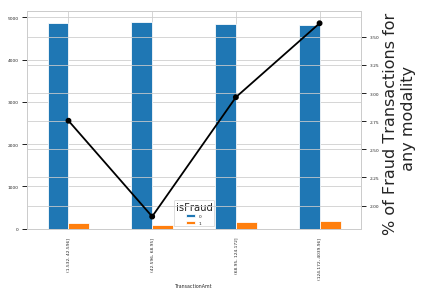

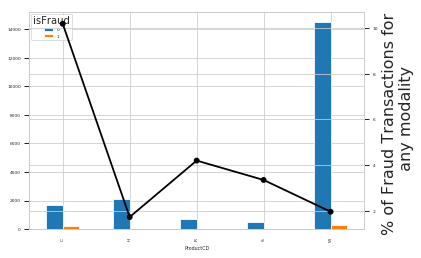

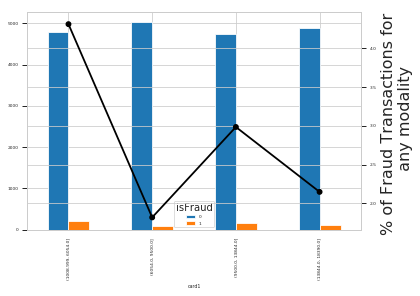

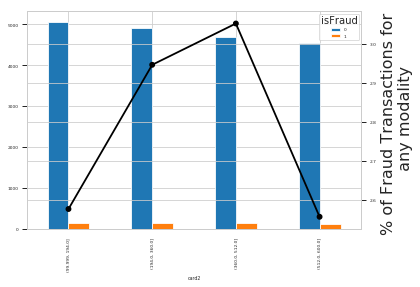

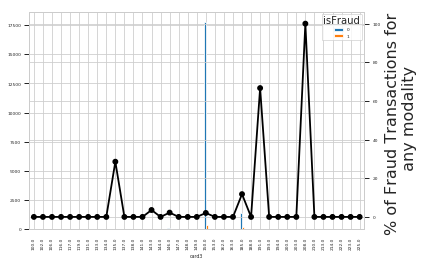

...

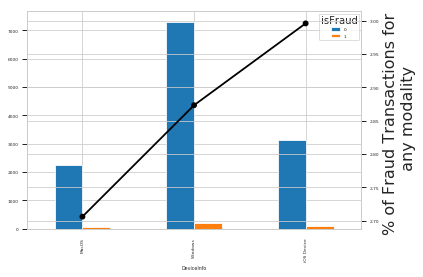

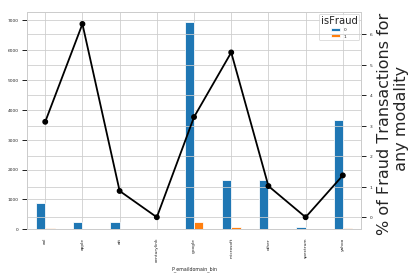

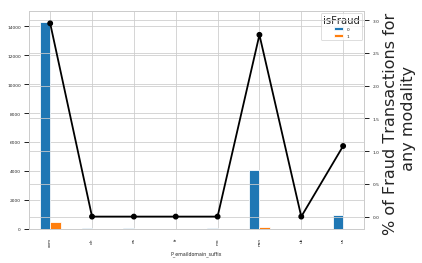

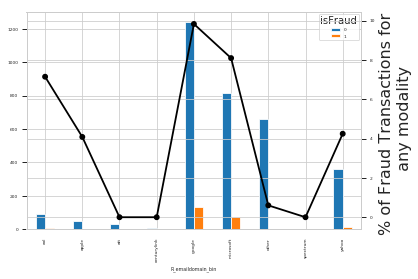

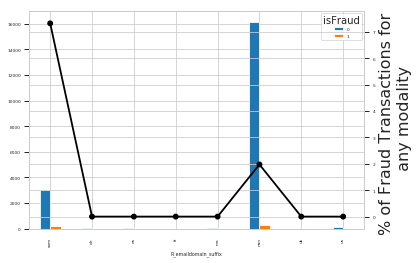

In [137]:
# la distribution de la fonction de la répartion pour isfraud=1 et =0 est réagissent de maniere différentes entre les differentes modalités
#la loi de varaible isFraud ne réagissengt pas de meme maniere au niveaux des différentes modalités
# pour vérifier de maniere statiqtique # consultez le cours de non paramétrique # partie d'ajustement et de comparaison
for i in train.columns[2:]:
  if (train[i].dtypes=='int64' or train[i].dtypes=='float64' )  and ((train[i].value_counts().shape[0] ) > 40)== True  : #and  (True in [i for i  in (train[i].value_counts() > 0.3*len(train[i]))]) ==False: # pil faut au moins en moyenne chaque valeurs sera répeter 13 fois
     y=pd.qcut(train[i],4,duplicates='drop')#,labels=["Ag1","Ag2", "Ag3"]), 15 a optimiser , comme on a choisit aleatoirement 15 donc on ne peur pas éradique les vr continues non corrélés avec isFraud. Par contre, on peut les supprimer dans le cas des varaibles qualit, mais on préfére de faire des test non para
  else:
    y=train[i].copy()

  x= train.isFraud.copy()
  #y=train[i].copy() 
  y=pd.DataFrame(y)
  x=pd.DataFrame(x)
  y['isFraud']=x.astype('category') # des pairs afin de faire le croisement 
  t=pd.crosstab(y[y.columns[0]],y['isFraud']).plot.bar()
######
  if (train[i].dtypes!='object' or train[i].dtypes=='object') :
    gt = t.twinx()
    tmp = pd.crosstab(y[i], y['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True) 
    gt = sns.pointplot(x=str(i), y='Fraud', data=tmp, color='black', legend=False)
    gt.set_ylabel("% of Fraud Transactions for \n any modality", fontsize=16) # pour comparer les pourcentages de frauds parmi les non frauds de chaque modalité, par rapport ceux des autres modalités : pour prendre en compte le poids de chaque modalité



In [0]:
# VISUALISATION DE LA DISTRIBUTION DES VARAIABLES 
def explore_data(features, inputs, path):
    ''' Explore data by plotting KDE graphs. '''
    
    #Define figure subplots
    fig = plt.figure(1)
    fig.subplots_adjust(bottom= -1, left=0.025, top = 2, right=0.975)
    
    #Loop through features    
    i = 1
    for col in features.columns:
      if i:  
        #Set subplot and plot format        
        sns.set_style("whitegrid")
        sns.set_context("paper", font_scale = 0.5, rc={"lines.linewidth": 1})
        plt.subplot(round((len(features.columns)/5)+1),5,0 + i)  #  10 courbes pour chaque ligne 
        j = i - 1
        
        #Plot KDE for all labels
        sns.distplot(inputs[inputs['isFraud'] == 1].iloc[:,j], hist = False, label = 'Fraud')
        sns.distplot(inputs[inputs['isFraud'] == 0].iloc[:,j], hist = False, label = 'No Fraud')
        #sns.distplot(inputs[inputs['FTR'] == 'H'].iloc[:,j], hist = False, label = 'HOME')
        plt.legend();
        i = i + 1
    
    #Define plot format    
    DefaultSize = fig.get_size_inches()
    fig.set_size_inches((DefaultSize[0]*2.2, DefaultSize[1]*2.2))

    plt.show()
    
    #Compute and print label weights
    labels = inputs.loc[:,'isFraud']
    class_weights = labels.value_counts() / len(labels)
    print(class_weights)
    
    #Store description of all features
    feature_details = features.describe().transpose()

    return feature_details
    

In [0]:
x=train.copy()
x['isFraud']=x['isFraud'].astype('object')

On va explorer nos données et créer des visualisations et calculer une estimation de la densité du noyau.

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to c

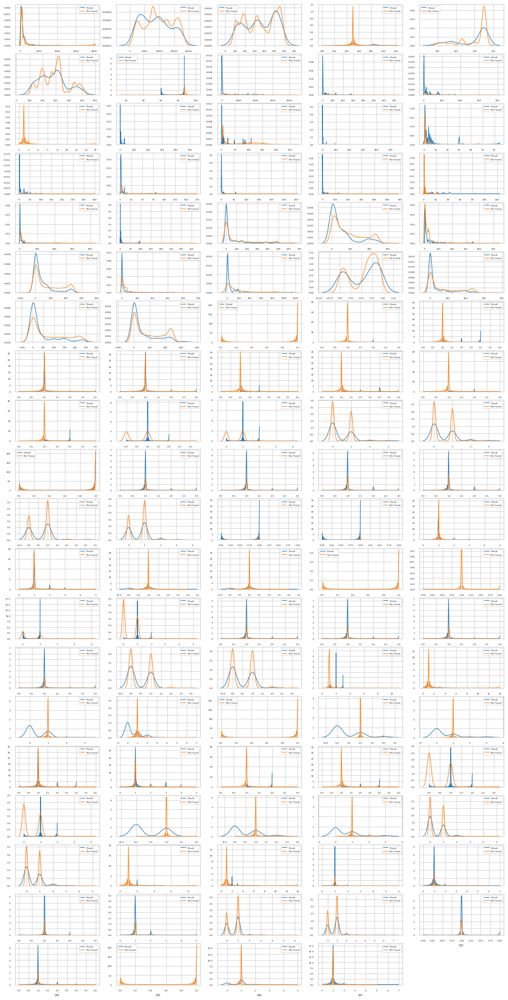

0    0.971899
1    0.028101
Name: isFraud, dtype: float64


In [140]:
variable_quant=[i for i in x.columns if  x[i].dtypes=='int64' or x[i].dtypes=='float64' and i != 'isFraud'][1:100]
import seaborn as sns
v=variable_quant.copy()
v.append('isFraud')
inputs=x[v].copy()
path=mypath
labels =inputs.loc[:,'isFraud']
features = x[variable_quant].copy()
feature_details = explore_data(features, inputs, path)

# toutes les varaibles suitent une loi normale : donc il ne faut pas normaliser les données , il suffit de les standardiser (neutralisation d'unité)

### Codage des Varibles Qualitatives à des varaibles indicatrices

In [141]:

variabel_quantitative=[i for i in train.columns if train[i].dtypes=='int64' or train[i].dtypes=='float64']
variabel_qualitative=[i for i in train.columns if train[i].dtypes=='object']
print("taille des varaibles qualitative",len(variabel_qualitative))
print("taille des varaibles qauntitative",len(variabel_quantitative))
variabel_qualitative_knn=[i for i in Train_knn.columns if Train_knn[i].dtypes=='object']
variabel_qualitative_mode=[i for i in Train_mode_mean.columns if Train_mode_mean[i].dtypes=='object']


taille des varaibles qualitative 31
taille des varaibles qauntitative 389


In [0]:
# codage des données nominatives (attention de la multi-colinéaroté)
def indic(base1,base2) :
  train_indicatrice=pd.DataFrame()
  test_indicatrice=pd.DataFrame()
  variabel_quali_train=[i for i in base1.columns if base1[i].dtypes=='object']
  train_indicatrice=pd.DataFrame(pd.get_dummies(base1[variabel_quali_train]))
  test_indicatrice=pd.DataFrame(pd.get_dummies(base2[variabel_quali_train]))
  # calibrage des deux base données 
  for i in [i for i in test_indicatrice.columns if i not in train_indicatrice.columns]:
    train_indicatrice[i]=0
  for i in [i for i in train_indicatrice.columns if i not in test_indicatrice.columns]:
    test_indicatrice[i]=0 
  # supression des anciennes colonnes
  base1.drop(variabel_quali_train, axis='columns', inplace=True)
  base2.drop(variabel_quali_train, axis='columns', inplace=True)
  #imputation
  base1[train_indicatrice.columns]=train_indicatrice[train_indicatrice.columns]
  base2[test_indicatrice.columns]=test_indicatrice[test_indicatrice.columns] 


In [0]:
indic(train,test)
indic(Train_knn,Test_knn)
indic(Train_mode_mean,Test_mode_mean)

In [144]:
# il faut  trouver une décalage d'une dégré entre la taille de train...et celle de test...
print(train.shape)
print(test.shape)
print(Train_knn.shape)
print(Test_knn.shape)
print(Train_mode_mean.shape)
print(Test_mode_mean.shape)

(19999, 498)
(19999, 497)
(19999, 500)
(19999, 499)
(19999, 498)
(19999, 497)


In [0]:
# la fonction qui va détecter et supprimer l'indexe de la premiere indicatrice pour chaque varaible (éviter de la multi-col)
def index_indicatrice(base_indicatrice,variable_de_base):
  for i in variable_de_base :
    conteur=0
    for j in base_indicatrice.columns : 
      if conteur == 0 and (i in j)==True:
        conteur +=1
        base_indicatrice.drop(j, axis='columns', inplace=True)





In [0]:
index_indicatrice(train,variabel_qualitative)
index_indicatrice(test,variabel_qualitative)
index_indicatrice(Train_knn,variabel_qualitative_knn)
index_indicatrice(Test_knn,variabel_qualitative_knn)
index_indicatrice(Train_mode_mean,variabel_qualitative_mode)
index_indicatrice(Test_mode_mean,variabel_qualitative_mode)


In [0]:
  # calibrage des deux base données 
for i in [i for i in Train_knn.columns if i not in Train_mode_mean.columns]:
  Train_mode_mean[i]=0
  Test_mode_mean[i]=0
for i in [i for i in Train_mode_mean.columns if i not in Train_knn.columns]:
  Train_knn[i]=0
  Test_knn[i]=0

In [148]:
# il faut  trouver une décalage d'une dégré entre la taille de train...et celle de test...
print(train.shape)
print(test.shape)
print(Train_knn.shape)
print(Test_knn.shape)
print(Train_mode_mean.shape)
print(Test_mode_mean.shape)

(19999, 467)
(19999, 466)
(19999, 470)
(19999, 469)
(19999, 470)
(19999, 469)


résumé: on a 2 bases de données au final avec seulement des varaibles significatives continues et qualitatives codées:


*   imputé par les méthodes usuelles 
*   par KNN 


#Matrice de Corréllation : 

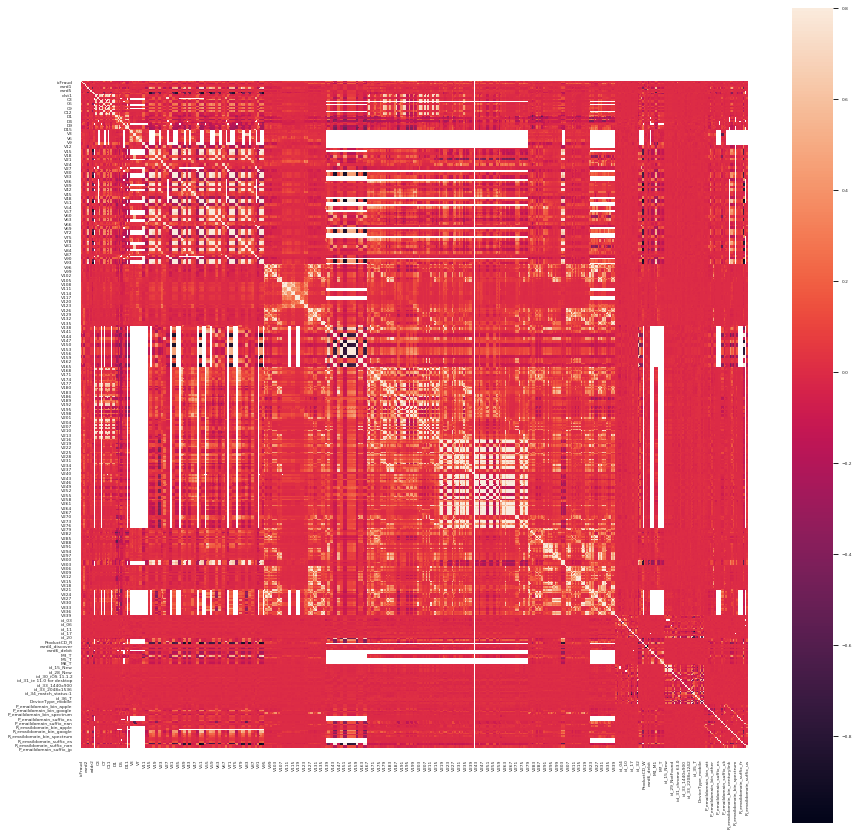

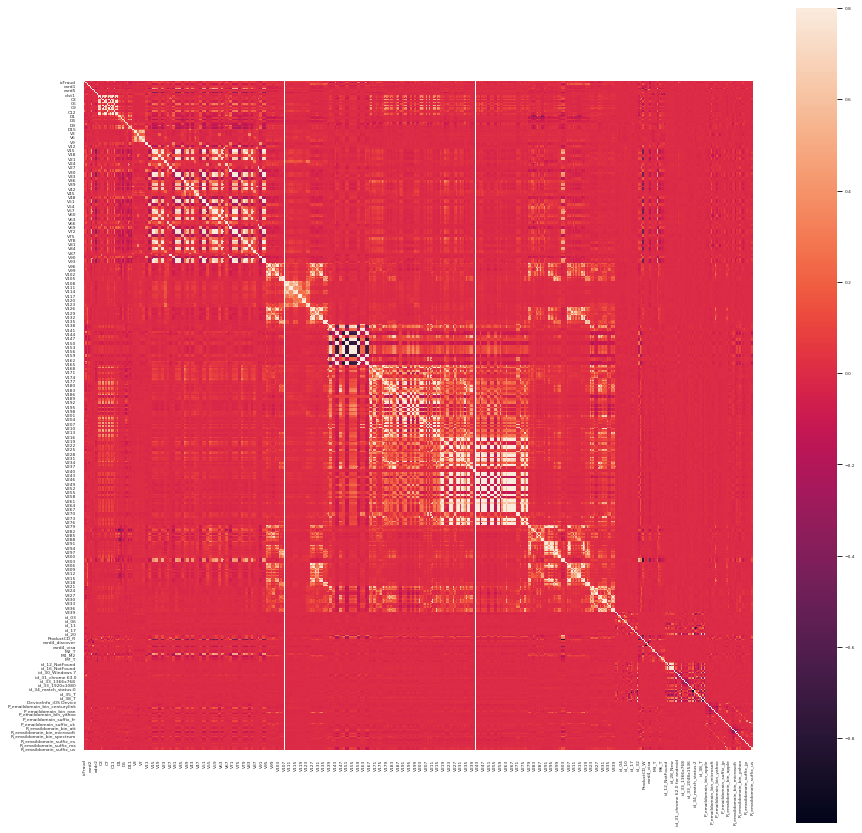

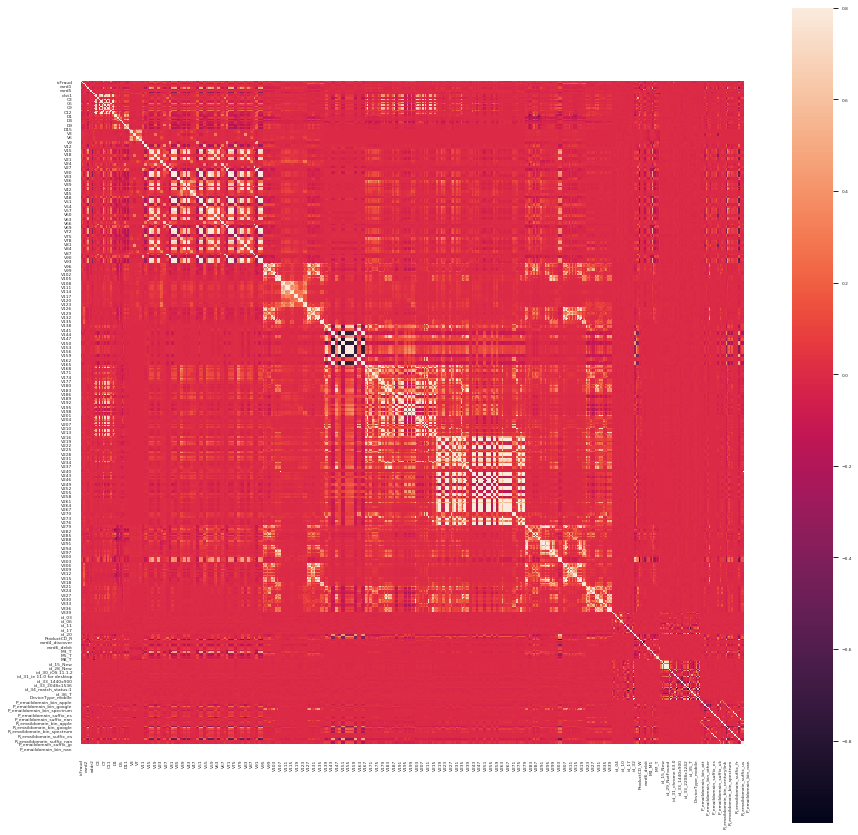

In [149]:
# corrélation 
fig = plt.figure(figsize = (15,15))
sb.heatmap(train.corr(), vmax = .8, square = True)
plt.show()

fig = plt.figure(figsize = (15,15))
sb.heatmap(Train_knn.corr(), vmax = .8, square = True)
plt.show()
fig = plt.figure(figsize = (15,15))
sb.heatmap(Train_mode_mean.corr(), vmax = .8, square = True)
plt.show()

##Split

In [0]:
# Séparation
#train 

y_train_knn = Train_knn['isFraud'].astype("uint8").copy()
x_train_knn=  Train_knn.drop(['isFraud'], axis='columns')
# test
#y_test à prédire 
submission_knn=  Test_knn  #.drop([ 'TransactionID_x'], axis='columns')


#
y_train_mode_mean = Train_mode_mean['isFraud'].astype("uint8").copy()
x_train_mode_mean=  Train_mode_mean.drop(['isFraud'], axis='columns')
# test
#y_test à prédire 
submission_mode_mean=  Test_mode_mean #.drop([ 'TransactionID_x'], axis='columns')



In [0]:
# isfraud ==> catégorique
#forest random
# split train test prédiction 
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split( x_train_knn, y_train_knn, test_size=0.33, random_state=42)
X_train_mode_mean, X_test_mode_mean, y_train_mode_mean, y_test_mode_mean = train_test_split( x_train_mode_mean, y_train_mode_mean, test_size=0.33, random_state=42)


Implémentation LGBM without ACP: scaling n'est pas nécessaire dans ce cas 

In [0]:
# corrélation entre les varaibles aprés ACp 
#train_data = pd.DataFrame(X_train_ACP)
#C_mat = train_data.corr()
#fig = plt.figure(figsize = (15,15))
#sb.heatmap(C_mat, vmax = .8, square = True)
#plt.show()

In [0]:
from lightgbm import LGBMClassifier


In [0]:
rf = LGBMClassifier()
rf.fit(X_train_knn,y_train_knn)
predict_test=rf.predict_proba(X_test_knn)
predict_train = rf.predict_proba(X_train_knn)

In [180]:

print('test auc=air under curve:',roc_auc_score(y_test_knn,predict_test[:,1]))  
print('train auc =air under curve :',roc_auc_score(y_train_knn,predict_train[:,1]))

test auc=air under curve: 0.8750255209271602
train auc =air under curve : 1.0


In [0]:
rf = LGBMClassifier()
rf.fit(X_train_mode_mean,y_train_mode_mean)
predict_test=rf.predict_proba(X_test_mode_mean)
predict_train = rf.predict_proba(X_train_mode_mean)

In [182]:
print('test auc=air under curve:',roc_auc_score(y_test_mode_mean,predict_test[:,1]))  
print('train auc =air under curve :',roc_auc_score(y_train_mode_mean,predict_train[:,1]))

test auc=air under curve: 0.893317320202566
train auc =air under curve : 1.0
